# Week 2 Assignment
## Data Exploration
My name is Jiaming Zhu, and I'm exploration this dataset from the U.S. Department of Transportation. The name of this dataset is Major Safety Events, it contains major safety and security events from 2014 to 2023 of five differnt transit mode types (bus, bus rapid transit, light rail, heavy rail, and vanpool) in Los Angeles region. In this exploration assignment, I want to count the number of major safety events of each mode type, and plot column chart for it. I also want to show the location of each event on the map with different color icons.

In [2]:
# importing python libraries
import pandas as pd
import geopandas as gpd

In [3]:
# read and add shapefile to notebook
file = gpd.read_file('Data_week2/Major_Safety_Events.csv')
file

ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed


,NTD ID,Agency,Primary UZA UACE Code,Rail/Bus/Ferry,Mode Name,Mode,Type of Service,Fixed Route Flag,Year,Event Description,...,Occupant of Other Vehicle Serious Injuries,Other Injuries,Other Serious Injuries,Suicide Injuries,Suicide Serious Injuries,Total Serious Injuries,Person List,United States,US Counties,geometry
0,90154,Los Angeles County Metropolitan Transportation...,51445,Rail,Light Rail,LR,DO,TRUE,2023,{Redacted} {Redacted} investigation revealed t...,...,0,0,0,0,0,0,,6,2090,None
1,90154,Los Angeles County Metropolitan Transportation...,51445,Bus,Bus,MB,DO,TRUE,2023,Bus operator hit the brakes hard to avoid a ve...,...,0,0,0,0,0,0,I Passenger Senior Citizen (61 and up) F ; ...,6,2090,None
2,90154,Los Angeles County Metropolitan Transportation...,51445,Bus,Bus,MB,DO,TRUE,2022,Suspect assaulted victim while riding the bus ...,...,0,0,0,0,0,0,I Passenger Adult (19 to 60) M,6,2090,None
3,90154,Los Angeles County Metropolitan Transportation...,51445,Rail,Light Rail,LR,DO,TRUE,2022,{Redacted} was attacked by suspect while ridin...,...,0,0,0,0,0,0,I Passenger Adult (19 to 60) M Y,6,2090,None
4,90154,Los Angeles County Metropolitan Transportation...,51445,Rail,Light Rail,LR,DO,TRUE,2022,{Redacted} was attacked by suspect while ridin...,...,0,0,0,0,0,0,I Passenger Adult (19 to 60) M Y,6,2090,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2249,90154,Los Angeles County Metropolitan Transportation...,51445,Rail,Light Rail,LR,DO,TRUE,2014,{Redacted} was standing on the south side of t...,...,0,0,0,0,0,0,I Wait Leave Adult (19 to 60) M,,,None
2250,90154,Los Angeles County Metropolitan Transportation...,51445,Bus,Bus,MB,DO,TRUE,2014,The victim was riding her bicycle by the {Reda...,...,0,0,0,0,0,0,I Wait Leave Teen (13 to 18) F,,,None
2251,90154,Los Angeles County Metropolitan Transportation...,51445,Bus,Bus,MB,DO,TRUE,2014,{Redacted} ( Bus ) EB # {Redacted} lane of {Re...,...,0,0,0,0,0,0,I Passenger Adult (19 to 60) F ; I Passe...,,,None
2252,90154,Los Angeles County Metropolitan Transportation...,51445,Rail,Light Rail,LR,DO,TRUE,2014,A {Redacted} ) was at {Redacted} {Redacted} tr...,...,0,0,0,0,0,0,I Wait Leave Adult (19 to 60) F,,,None


In [4]:
# determine the data type
type(file)

geopandas.geodataframe.GeoDataFrame

In [5]:
# show the first 5 rows of the data
file.head()

,NTD ID,Agency,Primary UZA UACE Code,Rail/Bus/Ferry,Mode Name,Mode,Type of Service,Fixed Route Flag,Year,Event Description,...,Occupant of Other Vehicle Serious Injuries,Other Injuries,Other Serious Injuries,Suicide Injuries,Suicide Serious Injuries,Total Serious Injuries,Person List,United States,US Counties,geometry
0,90154,Los Angeles County Metropolitan Transportation...,51445,Rail,Light Rail,LR,DO,TRUE,2023,{Redacted} {Redacted} investigation revealed t...,...,0,0,0,0,0,0,,6,2090,None
1,90154,Los Angeles County Metropolitan Transportation...,51445,Bus,Bus,MB,DO,TRUE,2023,Bus operator hit the brakes hard to avoid a ve...,...,0,0,0,0,0,0,I Passenger Senior Citizen (61 and up) F ; ...,6,2090,None
2,90154,Los Angeles County Metropolitan Transportation...,51445,Bus,Bus,MB,DO,TRUE,2022,Suspect assaulted victim while riding the bus ...,...,0,0,0,0,0,0,I Passenger Adult (19 to 60) M,6,2090,None
3,90154,Los Angeles County Metropolitan Transportation...,51445,Rail,Light Rail,LR,DO,TRUE,2022,{Redacted} was attacked by suspect while ridin...,...,0,0,0,0,0,0,I Passenger Adult (19 to 60) M Y,6,2090,None
4,90154,Los Angeles County Metropolitan Transportation...,51445,Rail,Light Rail,LR,DO,TRUE,2022,{Redacted} was attacked by suspect while ridin...,...,0,0,0,0,0,0,I Passenger Adult (19 to 60) M Y,6,2090,None


In [6]:
# show the last row of the data
file.tail(1)

,NTD ID,Agency,Primary UZA UACE Code,Rail/Bus/Ferry,Mode Name,Mode,Type of Service,Fixed Route Flag,Year,Event Description,...,Occupant of Other Vehicle Serious Injuries,Other Injuries,Other Serious Injuries,Suicide Injuries,Suicide Serious Injuries,Total Serious Injuries,Person List,United States,US Counties,geometry
2253,90154,Los Angeles County Metropolitan Transportation...,51445,Bus,Bus,MB,DO,TRUE,2014,The victim boarded the {Redacted} Bus # {Redac...,...,0,0,0,0,0,0,I Passenger Teen (13 to 18) M,,,None


In [7]:
# show 5 random samples of the data
file.sample(5)

,NTD ID,Agency,Primary UZA UACE Code,Rail/Bus/Ferry,Mode Name,Mode,Type of Service,Fixed Route Flag,Year,Event Description,...,Occupant of Other Vehicle Serious Injuries,Other Injuries,Other Serious Injuries,Suicide Injuries,Suicide Serious Injuries,Total Serious Injuries,Person List,United States,US Counties,geometry
360,90154,Los Angeles County Metropolitan Transportation...,51445,Rail,Light Rail,LR,DO,TRUE,2022,{Redacted} was attacked by suspect for no reas...,...,0,0,0,0,0,0,I Passenger Senior Citizen (61 and up) M Y,6,2090,None
1942,90154,Los Angeles County Metropolitan Transportation...,51445,Bus,Bus,MB,DO,TRUE,2015,{Redacted} ( Bus ) NB # {Redacted} lane of {Re...,...,0,0,0,0,0,0,I Passenger Unknown F ; I Passenger Unkn...,,,None
1864,90154,Los Angeles County Metropolitan Transportation...,51445,Bus,Bus,MB,DO,TRUE,2015,{Redacted} ( Bus ) WB # {Redacted} lane of {Re...,...,0,0,0,0,0,0,,,,None
905,90154,Los Angeles County Metropolitan Transportation...,51445,Bus,Bus,MB,DO,TRUE,2019,{Redacted} was assaulted by an unknown subject...,...,0,0,0,0,0,0,I Passenger Senior Citizen (61 and up) M,6,2090,None
315,90154,Los Angeles County Metropolitan Transportation...,51445,Bus,Bus,MB,DO,TRUE,2022,{Redacted} ( {Redacted} ) was on south curb st...,...,0,0,0,0,0,0,I Ped Walking Road Adult (19 to 60) M,6,2090,None


In [8]:
# show data type for each column
file.dtypes

NTD ID                      object
Agency                      object
Primary UZA UACE Code       object
Rail/Bus/Ferry              object
Mode Name                   object
                            ...   
Total Serious Injuries      object
Person List                 object
United States               object
US Counties                 object
geometry                  geometry
Length: 110, dtype: object

In [9]:
# total rows and columns in the dataset
file.shape

(2254, 110)

In [10]:
# show the name of each column
file.columns.to_list()

['NTD ID',
 'Agency',
 'Primary UZA UACE Code',
 'Rail/Bus/Ferry',
 'Mode Name',
 'Mode',
 'Type of Service',
 'Fixed Route Flag',
 'Year',
 'Event Description',
 'Incident Number',
 'Event Date',
 'Event Time',
 'Event Type',
 'Event Type Group',
 'Transit Worker Type',
 'Transit Worker Assault Detail Type',
 'Transit Worker Assault Flag',
 'Other Event Type Description',
 'Event Category',
 'Runaway Train Flag',
 'Safety/Security',
 'Collision With',
 'Property Damage',
 'Property Damage Type',
 'Total Injuries',
 'Total Fatalities',
 'Life Safety (Y/N)',
 'Number of Transit Vehicles Involved',
 'Towed (Y/N)',
 'Number of Vehicles Involved',
 'Location Type',
 'Approximate Address',
 'Latitude',
 'Longitude',
 'LatLon',
 'Evacuation Comment',
 'Self Evacuation (Y/N)',
 'Evacuation Location',
 'HazMat Type',
 'HazMat Type Description',
 'Fire Type',
 'Fire Fuel',
 'Other Fire Fuel Description',
 'Weather',
 'Lighting',
 'Current Condition',
 'Tide',
 'Road Configuration',
 'Track Conf

In [11]:
# get 5 random vaules for column Mode Name
file['Mode Name'].sample(5)

1627           Bus
2078           Bus
1534    Light Rail
76      Light Rail
2090    Light Rail
Name: Mode Name, dtype: object

In [12]:
# count the number of major safety events for each mode type
file['Mode Name'].value_counts()

Mode Name
Bus                  1252
Light Rail            783
Heavy Rail            186
Bus Rapid Transit      29
Vanpool                 4
Name: count, dtype: int64

In [13]:
# save it as a variable
line_count = file['Mode Name'].value_counts()
line_count

Mode Name
Bus                  1252
Light Rail            783
Heavy Rail            186
Bus Rapid Transit      29
Vanpool                 4
Name: count, dtype: int64

In [14]:
# data type of line_count
type(line_count)

pandas.core.series.Series

In [15]:
# convert the series into a dataframe
line_count = line_count.reset_index()
line_count

,Mode Name,count
0,Bus,1252
1,Light Rail,783
2,Heavy Rail,186
3,Bus Rapid Transit,29
4,Vanpool,4


In [16]:
# check data type of line_count
type(line_count)

pandas.core.frame.DataFrame

In [17]:
# rename columns
line_count.columns = ['Mode Type', 'Number of Major Events']
line_count

,Mode Type,Number of Major Events
0,Bus,1252
1,Light Rail,783
2,Heavy Rail,186
3,Bus Rapid Transit,29
4,Vanpool,4


<Axes: >

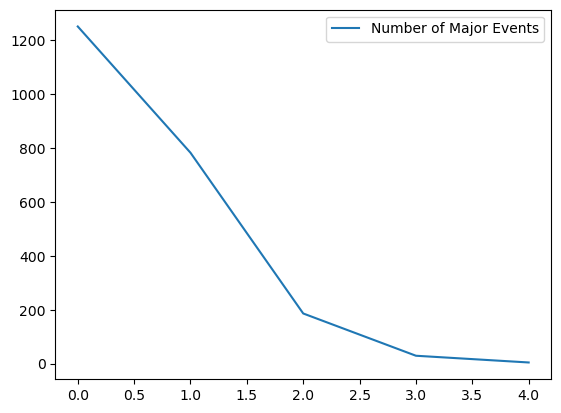

In [18]:
# plot the number of major events for each mode type
line_count.plot()

<Axes: title={'center': 'Number of Major Safety Events for Each Mode Type'}, xlabel='Mode Type'>

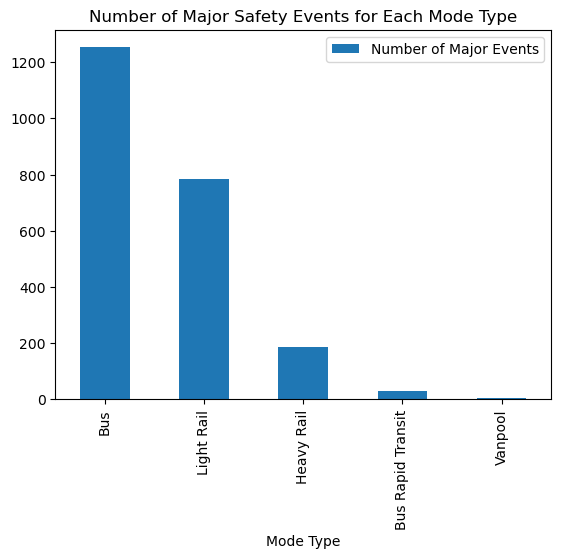

In [19]:
# give it additional arguments
line_count.plot.bar(x = 'Mode Type', y = 'Number of Major Events', title = 'Number of Major Safety Events for Each Mode Type')

In [20]:
# list of desired column names
desired_columns =['Mode Name','Mode','Year','Event Type','Latitude','Longitude','LatLon']

In [21]:
# show 5 random samples of desired columns
file[desired_columns].sample(5)

,Mode Name,Mode,Year,Event Type,Latitude,Longitude,LatLon
1540,Light Rail,LR,2016,Rail Collision,34.040409,-118.266406,POINT (-118.266406 34.040409)
175,Bus,MB,2022,Non-Rail Collision,33.95265,-118.18998,POINT (-118.18998 33.95265)
1950,Light Rail,LR,2015,Assault,,,
277,Light Rail,LR,2022,Rail Collision,33.768142,-118.189478,POINT (-118.189478 33.768142)
43,Bus,MB,2019,Assault,34.228786,-118.476377,POINT (-118.476377 34.228786)


In [22]:
# trimming the dataset
data_trimmed = file[desired_columns].copy()
data_trimmed

,Mode Name,Mode,Year,Event Type,Latitude,Longitude,LatLon
0,Light Rail,LR,2023,Rail Collision,34.03336,-118.16377,POINT (-118.16377 34.03336)
1,Bus,MB,2023,Other,34.02805,-118.21938,POINT (-118.21938 34.02805)
2,Bus,MB,2022,Assault,33.930941,-118.309252,POINT (-118.309252 33.930941)
3,Light Rail,LR,2022,Assault,33.928945,-118.238038,POINT (-118.238038 33.928945)
4,Light Rail,LR,2022,Assault,34.013961,-118.491508,POINT (-118.491508 34.013961)
...,...,...,...,...,...,...,...
2249,Light Rail,LR,2014,Assault,,,
2250,Bus,MB,2014,Rape,,,
2251,Bus,MB,2014,Non-Rail Collision,,,
2252,Light Rail,LR,2014,Robbery,,,


In [23]:
# check the data type of each columns
data_trimmed.dtypes

Mode Name     object
Mode          object
Year          object
Event Type    object
Latitude      object
Longitude     object
LatLon        object
dtype: object

In [24]:
# show rows that Latitude is not empty
data_trimmed[data_trimmed.Latitude != '']

,Mode Name,Mode,Year,Event Type,Latitude,Longitude,LatLon
0,Light Rail,LR,2023,Rail Collision,34.03336,-118.16377,POINT (-118.16377 34.03336)
1,Bus,MB,2023,Other,34.02805,-118.21938,POINT (-118.21938 34.02805)
2,Bus,MB,2022,Assault,33.930941,-118.309252,POINT (-118.309252 33.930941)
3,Light Rail,LR,2022,Assault,33.928945,-118.238038,POINT (-118.238038 33.928945)
4,Light Rail,LR,2022,Assault,34.013961,-118.491508,POINT (-118.491508 34.013961)
...,...,...,...,...,...,...,...
2020,Light Rail,LR,2015,Rail Collision,34.03998,-118.266814,POINT (-118.266814 34.03998)
2021,Heavy Rail,HR,2015,Attempted Suicide,34.1011194,-118.3258063,POINT (-118.3258063 34.1011194)
2027,Bus,MB,2015,Non-Rail Collision,34.0436431,-118.3089835,POINT (-118.3089835 34.0436431)
2039,Light Rail,LR,2015,Rail Collision,34.03104,-118.264604,POINT (-118.264604 34.03104)


In [25]:
# trimming the dataset
new_data_trimmed = data_trimmed[data_trimmed.Latitude != ''].copy()
new_data_trimmed

,Mode Name,Mode,Year,Event Type,Latitude,Longitude,LatLon
0,Light Rail,LR,2023,Rail Collision,34.03336,-118.16377,POINT (-118.16377 34.03336)
1,Bus,MB,2023,Other,34.02805,-118.21938,POINT (-118.21938 34.02805)
2,Bus,MB,2022,Assault,33.930941,-118.309252,POINT (-118.309252 33.930941)
3,Light Rail,LR,2022,Assault,33.928945,-118.238038,POINT (-118.238038 33.928945)
4,Light Rail,LR,2022,Assault,34.013961,-118.491508,POINT (-118.491508 34.013961)
...,...,...,...,...,...,...,...
2020,Light Rail,LR,2015,Rail Collision,34.03998,-118.266814,POINT (-118.266814 34.03998)
2021,Heavy Rail,HR,2015,Attempted Suicide,34.1011194,-118.3258063,POINT (-118.3258063 34.1011194)
2027,Bus,MB,2015,Non-Rail Collision,34.0436431,-118.3089835,POINT (-118.3089835 34.0436431)
2039,Light Rail,LR,2015,Rail Collision,34.03104,-118.264604,POINT (-118.264604 34.03104)


In [26]:
# check the data type of each columns
data_trimmed.dtypes

Mode Name     object
Mode          object
Year          object
Event Type    object
Latitude      object
Longitude     object
LatLon        object
dtype: object

In [27]:
# covert Latitude and Longitude from object to float
new_data_trimmed['Latitude']= new_data_trimmed.Latitude.astype(float)
new_data_trimmed['Longitude']= new_data_trimmed.Longitude.astype(float)

In [28]:
# check LaTLon data type
print(new_data_trimmed['LatLon'].apply(type).unique())

[<class 'str'>]


In [29]:
# convert object to WKT strings
new_data_trimmed['LatLon'] = new_data_trimmed['LatLon'].apply(lambda x: x.wkt if hasattr(x, 'wkt') else x)

In [30]:
# convert object to geometry for column LatLon
from shapely.geometry import Point
from shapely import wkt
new_data_trimmed['geometry'] = new_data_trimmed['LatLon'].apply(wkt.loads)
gnew_data_trimmed = gpd.GeoDataFrame(new_data_trimmed, geometry='geometry')

In [31]:
# check data type of each column again
gnew_data_trimmed.dtypes

Mode Name       object
Mode            object
Year            object
Event Type      object
Latitude       float64
Longitude      float64
LatLon          object
geometry      geometry
dtype: object

<Axes: >

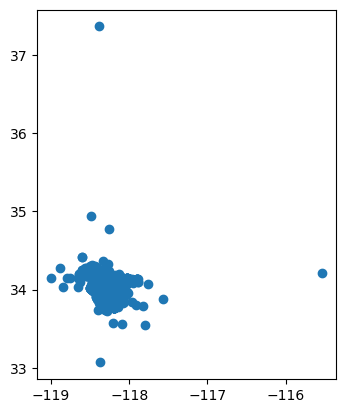

In [32]:
# plot data
gnew_data_trimmed.plot()

In [33]:
gnew_data_trimmed.geometry

0       POINT (-118.16377 34.03336)
1       POINT (-118.21938 34.02805)
2       POINT (-118.30925 33.93094)
3       POINT (-118.23804 33.92894)
4       POINT (-118.49151 34.01396)
                   ...             
2020    POINT (-118.26681 34.03998)
2021    POINT (-118.32581 34.10112)
2027    POINT (-118.30898 34.04364)
2039    POINT (-118.26460 34.03104)
2041    POINT (-118.44199 34.25160)
Name: geometry, Length: 1825, dtype: geometry

<Axes: >

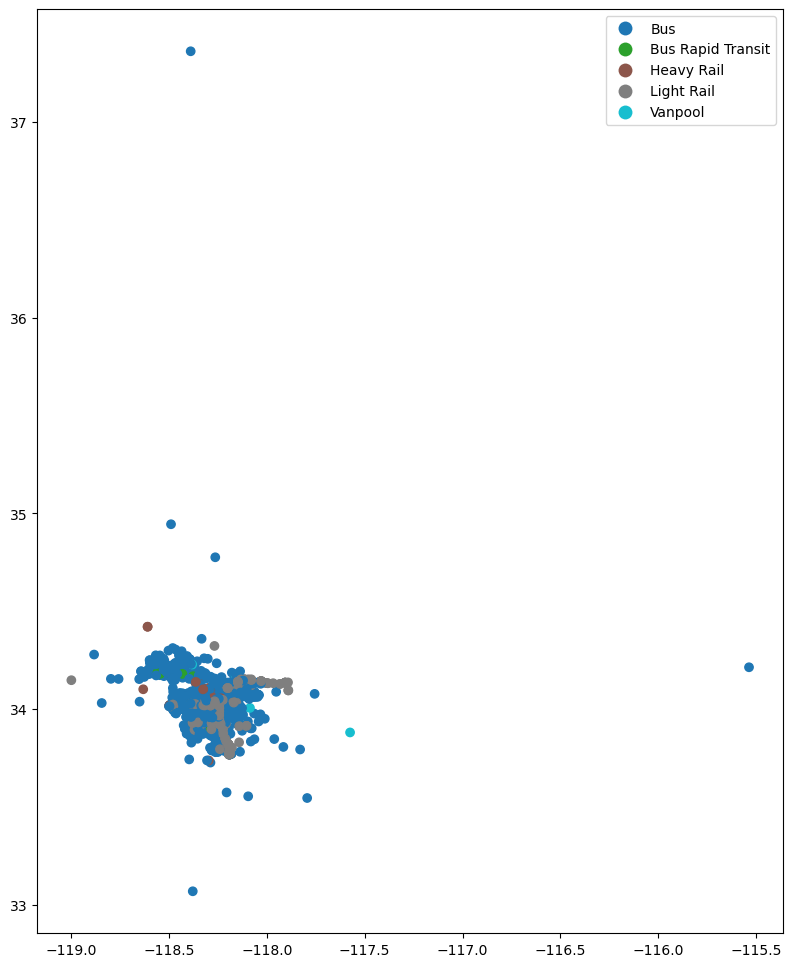

In [34]:
gnew_data_trimmed.plot(
            figsize=(20,12),   #size of the plot (a bit bigger than the default)
            column = 'Mode Name',   # column that defines the color of the dots
            legend = True,     # add a legend           
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1,1)
            }                  # this puts the legend to the side
) 

In [35]:
# default folium map
import folium
m = folium.Map()
m

In [36]:
# check what columns do we have
gnew_data_trimmed.columns.to_list()

['Mode Name',
 'Mode',
 'Year',
 'Event Type',
 'Latitude',
 'Longitude',
 'LatLon',
 'geometry']

In [39]:
# rename columns
gnew_data_trimmed.columns = ['Mode_Name', 'Mode', 'Year', 'Event_Type', 'Latitude', 'Longitude', 'LatLon', 'geometry']
gnew_data_trimmed.columns.to_list()

['Mode_Name',
 'Mode',
 'Year',
 'Event_Type',
 'Latitude',
 'Longitude',
 'LatLon',
 'geometry']

In [40]:
# adding point markers
for index, row in gnew_data_trimmed.iterrows():
    # add folium marker code
    folium.Marker([row.Latitude, row.Longitude], popup=row.Event_Type, tooltip=row.Mode_Name).add_to(m)
m

In [41]:
# add a new column named color
gnew_data_trimmed['color'] = ''
gnew_data_trimmed.head()

,Mode_Name,Mode,Year,Event_Type,Latitude,Longitude,LatLon,geometry,color
0,Light Rail,LR,2023,Rail Collision,34.033360,-118.163770,POINT (-118.16377 34.03336),POINT (-118.16377 34.03336),
1,Bus,MB,2023,Other,34.028050,-118.219380,POINT (-118.21938 34.02805),POINT (-118.21938 34.02805),
2,Bus,MB,2022,Assault,33.930941,-118.309252,POINT (-118.309252 33.930941),POINT (-118.30925 33.93094),
3,Light Rail,LR,2022,Assault,33.928945,-118.238038,POINT (-118.238038 33.928945),POINT (-118.23804 33.92894),
4,Light Rail,LR,2022,Assault,34.013961,-118.491508,POINT (-118.491508 34.013961),POINT (-118.49151 34.01396),


In [53]:
# add unique color for each Mode Type
gnew_data_trimmed.loc[gnew_data_trimmed['Mode_Name'] == 'Bus', 'color'] = 'blue'
gnew_data_trimmed.loc[gnew_data_trimmed['Mode_Name'] == 'Bus Rapid Transit', 'color'] = 'black'
gnew_data_trimmed.loc[gnew_data_trimmed['Mode_Name'] == 'Heavy Rail', 'color'] = 'red'
gnew_data_trimmed.loc[gnew_data_trimmed['Mode_Name'] == 'Light Rail', 'color'] = 'green'
gnew_data_trimmed.loc[gnew_data_trimmed['Mode_Name'] == 'Vanpool', 'color'] = 'purple'

In [54]:
# check the work
gnew_data_trimmed.sample(5)

,Mode_Name,Mode,Year,Event_Type,Latitude,Longitude,LatLon,geometry,color
1119,Light Rail,LR,2018,Assault,34.022161,-118.333520,POINT (-118.33352 34.022161),POINT (-118.33352 34.02216),green
808,Bus,MB,2019,Non-Rail Collision,34.003771,-118.278321,POINT (-118.278321 34.003771),POINT (-118.27832 34.00377),blue
367,Heavy Rail,HR,2021,Assault,34.049492,-118.259712,POINT (-118.259712 34.049492),POINT (-118.25971 34.04949),red
1463,Bus Rapid Transit,RB,2017,Non-Rail Collision,34.184019,-118.562273,POINT (-118.562273 34.184019),POINT (-118.56227 34.18402),black
1652,Bus Rapid Transit,RB,2016,Non-Rail Collision,34.185907,-118.501037,POINT (-118.501037 34.185907),POINT (-118.50104 34.18591),black


In [55]:
# calculate mean latitude
latitude = gnew_data_trimmed.Latitude.mean()
latitude

34.02689267205479

In [56]:
# calculate mean longitude
longitude = gnew_data_trimmed.Longitude.mean()
longitude

-118.28265522536988

In [57]:
# reset the map
m = folium.Map(location=[latitude,longitude], tiles='Major Event', zoom_start=10)
m

ValueError: Custom tiles must have an attribution.

In [58]:
# add the major events of different mode types with color icons
for index, row in gnew_data_trimmed.iterrows():
    folium.Marker(
        [row.Latitude,row.Longitude], 
        popup=row.Event_Type, 
        tooltip=row.Mode_Name,
        icon=folium.Icon(color=row.color)
    ).add_to(m)

# show the map
m

In [59]:
# save the interactive maps as an html file
m.save('major_event.html')